# [オンライン開催]PyTorchで学ぶ深層学習入門第5回
このチュートリアルでは、最近の新しいトレンドである Transformers for Computer Vision を詳しく見ていきます。アレクセイ・ドソヴィツキーら以来、さまざまな画像認識ベンチマークに Transformer を適用することに成功しましたが、CNN がコンピューター ビジョンに最適なアーキテクチャではない可能性があることを示す膨大な量のフォローアップ作業がありました。しかし、ビジョン トランスフォーマーはどのように正確に機能し、CNN とは対照的にどのような利点と欠点があるのでしょうか?ビジョン トランスフォーマーを自分で実装し、人気のある小さなデータセット CIFAR10 でトレーニングすることで、これらの疑問を解消して行きます。

後半に、Transfomer モデルについて説明していきます。  
後半では、2017年で最も影響力のあるアーキテクチャの 1 つである Transformer モデルについて説明します。 Vaswani らによる論文 Attention Is All You Need 以来。 2017 年に公開された Transformer アーキテクチャは、多くのドメイン、特に自然言語処理でベンチマークを打ち負かし続けています。信じられないほど多くのパラメーターを備えたトランスフォーマーは、長く説得力のあるエッセイを生成し、AI の新しい応用分野を切り開きました。 Transformer アーキテクチャをベースとするモデルは今後数年で終わらないように思われるため、それがどのように機能するかを理解し、このノートブックで実行する方法を自分で実装することが重要です。

以下では、標準ライブラリをインポートします。前回 と同様に、追加のフレームワークとして PyTorch Lightning を使用します。 PyTorch Lightning に慣れていない場合は、4回目のノートブック をよく読んでください。

## Section0. 準備

In [1]:
## いつものライブラリをインポート
import os
import numpy as np 
import random
import math
import json
from functools import partial

In [2]:
## 可視化のためのライブラリ
import matplotlib.pyplot as plt
plt.set_cmap('cividis')
%matplotlib inline 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()

<Figure size 432x288 with 0 Axes>

In [3]:
## tqdm for loading bars
from tqdm.notebook import tqdm

In [4]:
## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim

In [5]:
# 画像認識系のパッケージ
## Torchvision
import torchvision
from torchvision.datasets import CIFAR10, CIFAR100
from torchvision import transforms

In [6]:
# PyTorch Lightning
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

In [8]:
# データセット ダウンロード先のフォルダパス (例: CIFAR10)
DATASET_PATH = "../data"
# 事前トレーニング済みモデルが保存されるフォルダーパス
CHECKPOINT_PATH = "../saved_models/vol5"

# 乱数設定のための関数
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
set_seed(42)

# 再現性を確保するために、すべての操作が GPU (使用されている場合) であることを確認
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

## Section1. Vision Transformers

In [ ]:
import urllib.request
from urllib.error import HTTPError
# Github URL where saved models are stored for this tutorial
base_url = "https://raw.githubusercontent.com/phlippe/saved_models/main/"
# Files to download
pretrained_files = ["tutorial15/ViT.ckpt", "tutorial15/tensorboards/ViT/events.out.tfevents.ViT",
                    "tutorial5/tensorboards/ResNet/events.out.tfevents.resnet"]
# Create checkpoint path if it doesn't exist yet
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# For each file, check whether it already exists. If not, try downloading it.
for file_name in pretrained_files:
    file_path = os.path.join(CHECKPOINT_PATH, file_name.split("/",1)[1])
    if "/" in file_name.split("/",1)[1]:
        os.makedirs(file_path.rsplit("/",1)[0], exist_ok=True)
    if not os.path.isfile(file_path):
        file_url = base_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try to download the file from the GDrive folder, or contact the author with the full output including the following error:\n", e)

以下の CIFAR10 データセットを読み込みます。公正な比較を維持するために、前回 の CNN と同じデータセットとデータ拡張のセットアップを使用します。 transforms.Normalize の定数は、データをゼロ平均と 1 の標準偏差にスケーリングおよびシフトする値に対応します。

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ../data/cifar-10-python.tar.gz to ../data
Files already downloaded and verified


INFO:lightning_fabric.utilities.seed:Global seed set to 42
INFO:lightning_fabric.utilities.seed:Global seed set to 42


Files already downloaded and verified


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


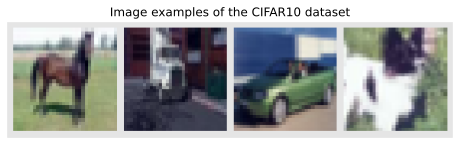

In [ ]:
test_transform = transforms.Compose([transforms.ToTensor(),
                                     transforms.Normalize([0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784])
                                     ])
# For training, we add some augmentation. Networks are too powerful and would overfit.
train_transform = transforms.Compose([transforms.RandomHorizontalFlip(),
                                      transforms.RandomResizedCrop((32,32),scale=(0.8,1.0),ratio=(0.9,1.1)),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784])
                                     ])
# Loading the training dataset. We need to split it into a training and validation part
# We need to do a little trick because the validation set should not use the augmentation.
train_dataset = CIFAR10(root=DATASET_PATH, train=True, transform=train_transform, download=True)
val_dataset = CIFAR10(root=DATASET_PATH, train=True, transform=test_transform, download=True)
pl.seed_everything(42)
train_set, _ = torch.utils.data.random_split(train_dataset, [45000, 5000])
pl.seed_everything(42)
_, val_set = torch.utils.data.random_split(val_dataset, [45000, 5000])

# Loading the test set
test_set = CIFAR10(root=DATASET_PATH, train=False, transform=test_transform, download=True)

# We define a set of data loaders that we can use for various purposes later.
train_loader = data.DataLoader(train_set, batch_size=128, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)
val_loader = data.DataLoader(val_set, batch_size=128, shuffle=False, drop_last=False, num_workers=4)
test_loader = data.DataLoader(test_set, batch_size=128, shuffle=False, drop_last=False, num_workers=4)

# Visualize some examples
NUM_IMAGES = 4
CIFAR_images = torch.stack([val_set[idx][0] for idx in range(NUM_IMAGES)], dim=0)
img_grid = torchvision.utils.make_grid(CIFAR_images, nrow=4, normalize=True, pad_value=0.9)
img_grid = img_grid.permute(1, 2, 0)

plt.figure(figsize=(8,8))
plt.title("Image examples of the CIFAR10 dataset")
plt.imshow(img_grid)
plt.axis('off')
plt.show()
plt.close()

### Section1-1. 画像分類のためのTransformer
トランスフォーマーはもともとセットを処理するために提案されてきました。これは、順列同変アーキテクチャであるためです。トランスフォーマーをシーケンスに適用するために、入力特徴ベクトルに位置エンコーディングを追加するだけで、モデルはそれをどう処理するかを学習しました。では、画像に対して同じことをしてみませんか?これはまさにアレクセイ・ドソヴィツキーらのことです。彼らの論文「画像は 16x16 ワードに値する: 大規模な画像認識のためのトランスフォーマー」で提案されています。特に、Vision Transformer は、画像を小さなパッチのシーケンスとして表示する画像分類のモデルです。前処理ステップとして、たとえば次の画像を分割します。
 ピクセルを 9 に
 パッチ。これらの各パッチは「単語」/「トークン」と見なされ、特徴空間に射影されます。位置エンコーディングと分類用のトークンを上に追加することで、通常どおりこのシーケンスに Transformer を適用し、タスクのトレーニングを開始できます。

In [ ]:
def img_to_patch(x, patch_size, flatten_channels=True):
    """
    Inputs:
        x - torch.Tensor representing the image of shape [B, C, H, W]
        patch_size - Number of pixels per dimension of the patches (integer)
        flatten_channels - If True, the patches will be returned in a flattened format
                           as a feature vector instead of a image grid.
    """
    B, C, H, W = x.shape
    x = x.reshape(B, C, H//patch_size, patch_size, W//patch_size, patch_size)
    x = x.permute(0, 2, 4, 1, 3, 5) # [B, H', W', C, p_H, p_W]
    x = x.flatten(1,2)              # [B, H'*W', C, p_H, p_W]
    if flatten_channels:
        x = x.flatten(2,4)          # [B, H'*W', C*p_H*p_W]
    return x

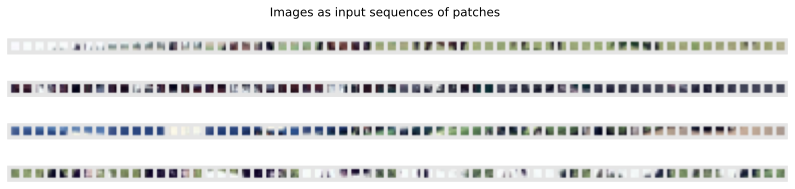

In [ ]:
img_patches = img_to_patch(CIFAR_images, patch_size=4, flatten_channels=False)

fig, ax = plt.subplots(CIFAR_images.shape[0], 1, figsize=(14,3))
fig.suptitle("Images as input sequences of patches")
for i in range(CIFAR_images.shape[0]):
    img_grid = torchvision.utils.make_grid(img_patches[i], nrow=64, normalize=True, pad_value=0.9)
    img_grid = img_grid.permute(1, 2, 0)
    ax[i].imshow(img_grid)
    ax[i].axis('off')
plt.show()
plt.close()

元の画像と比較すると、これらのパッチ リストのオブジェクトを認識するのは非常に難しくなっています。それでも、これは画像を分類するために Transformer に提供する入力です。モデルは、オブジェクトを認識するためにパッチを組み合わせる方法を学習する必要があります。画像がピクセルのグリッドであるという CNN の誘導バイアスは、この入力形式では失われます。

前処理を確認したら、Transformer モデルの構築を開始できます。後述する Multi-Head Attention の基礎について説明します。ここでは PyTorch モジュール `nn.MultiheadAttention`  を使用します。さらに、Ruibin Xiong らによって提案された Transformer ブロックの Pre-Layer Normalization バージョンを使用します。レイヤーの正規化を残差ブロック間ではなく、残差ブロックの最初のレイヤーとして適用するという考え方です。このレイヤーの再編成により、勾配の流れが改善され、ウォームアップ段階が不要になります。標準の Post-LN バージョンと Pre-LN バージョンの違いを視覚化したものを以下に示します。

In [ ]:
class AttentionBlock(nn.Module):
    
    def __init__(self, embed_dim, hidden_dim, num_heads, dropout=0.0):
        """
        Inputs:
            embed_dim - Dimensionality of input and attention feature vectors
            hidden_dim - Dimensionality of hidden layer in feed-forward network 
                         (usually 2-4x larger than embed_dim)
            num_heads - Number of heads to use in the Multi-Head Attention block
            dropout - Amount of dropout to apply in the feed-forward network
        """
        super().__init__()
        
        self.layer_norm_1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, 
                                          dropout=dropout)
        self.layer_norm_2 = nn.LayerNorm(embed_dim)
        self.linear = nn.Sequential(
            nn.Linear(embed_dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embed_dim),
            nn.Dropout(dropout)
        )
        
        
    def forward(self, x):
        inp_x = self.layer_norm_1(x)
        x = x + self.attn(inp_x, inp_x, inp_x)[0]
        x = x + self.linear(self.layer_norm_2(x))
        return x

これで、独自の Vision Transformer を構築するためのすべてのモジュールの準備が整いました。 Transformer エンコーダーに加えて、次のモジュールが必要です。

入力パッチをより大きなサイズの特徴ベクトルにマッピングする線形投影レイヤー。それぞれを取る単純な線形レイヤーによって実装されます
 入力として個別にパッチします。
入力シーケンスに追加される分類トークン。分類予測を決定するために、分類トークン (略して CLS トークン) の出力特徴ベクトルを使用します。
Transformer によって処理される前にトークンに追加される学習可能な位置エンコーディング。これらは、位置に依存する情報を学習し、セットをシーケンスに変換するために必要です。通常は固定解像度で作業するため、サイン関数とコサイン関数のパターンではなく、位置エンコーディングを学習できます。
CLS トークンの出力特徴ベクトルを取得し、それを分類予測にマップする MLP ヘッド。これは通常、小さなフィードフォワード ネットワークまたは単一の線形層によって実装されます。
これらのコンポーネントを念頭に置いて、以下の完全な Vision Transformer を実装しましょう。

In [ ]:
class VisionTransformer(nn.Module):
    
    def __init__(self, embed_dim, hidden_dim, num_channels, num_heads, num_layers, num_classes, patch_size, num_patches, dropout=0.0):
        """
        Inputs:
            embed_dim - Dimensionality of the input feature vectors to the Transformer
            hidden_dim - Dimensionality of the hidden layer in the feed-forward networks
                         within the Transformer
            num_channels - Number of channels of the input (3 for RGB)
            num_heads - Number of heads to use in the Multi-Head Attention block
            num_layers - Number of layers to use in the Transformer
            num_classes - Number of classes to predict
            patch_size - Number of pixels that the patches have per dimension
            num_patches - Maximum number of patches an image can have
            dropout - Amount of dropout to apply in the feed-forward network and 
                      on the input encoding
        """
        super().__init__()
        
        self.patch_size = patch_size
        
        # Layers/Networks
        self.input_layer = nn.Linear(num_channels*(patch_size**2), embed_dim)
        self.transformer = nn.Sequential(*[AttentionBlock(embed_dim, hidden_dim, num_heads, dropout=dropout) for _ in range(num_layers)])
        self.mlp_head = nn.Sequential(
            nn.LayerNorm(embed_dim),
            nn.Linear(embed_dim, num_classes)
        )
        self.dropout = nn.Dropout(dropout)
        
        # Parameters/Embeddings
        self.cls_token = nn.Parameter(torch.randn(1,1,embed_dim))
        self.pos_embedding = nn.Parameter(torch.randn(1,1+num_patches,embed_dim))
    
    
    def forward(self, x):
        # Preprocess input
        x = img_to_patch(x, self.patch_size)
        B, T, _ = x.shape
        x = self.input_layer(x)
        
        # Add CLS token and positional encoding
        cls_token = self.cls_token.repeat(B, 1, 1)
        x = torch.cat([cls_token, x], dim=1)
        x = x + self.pos_embedding[:,:T+1]
        
        # Apply Transforrmer
        x = self.dropout(x)
        x = x.transpose(0, 1)
        x = self.transformer(x)
        
        # Perform classification prediction
        cls = x[0]
        out = self.mlp_head(cls)
        return out

最後に、いつものようにすべてを PyTorch Lightning モジュールに入れることができます。 `torch.optim.AdamW` をオプティマイザーとして使用します。これは、修正された重み減衰の実装を持つ `Adam` です。 Pre-LN Transformer バージョンを使用しているため、学習率のウォームアップ ステージを使用する必要がなくなりました。代わりに、画像分類に関する以前のチュートリアルの CNN と同じ学習率スケジューラを使用します。

In [ ]:
class ViT(pl.LightningModule):
    
    def __init__(self, model_kwargs, lr):
        super().__init__()
        self.save_hyperparameters()
        self.model = VisionTransformer(**model_kwargs)
        self.example_input_array = next(iter(train_loader))[0]
        
    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.hparams.lr)
        lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100,150], gamma=0.1)
        return [optimizer], [lr_scheduler]   
    
    def _calculate_loss(self, batch, mode="train"):
        imgs, labels = batch
        preds = self.model(imgs)
        loss = F.cross_entropy(preds, labels)
        acc = (preds.argmax(dim=-1) == labels).float().mean()
        
        self.log(f'{mode}_loss', loss)
        self.log(f'{mode}_acc', acc)
        return loss

    def training_step(self, batch, batch_idx):
        loss = self._calculate_loss(batch, mode="train")
        return loss

    def validation_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode="val")

    def test_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode="test")

### Section1-2. 試す
通常、ビジョン トランスフォーマーは、ImageNet などの大規模な画像分類ベンチマークに適用され、その可能性を最大限に活用します。ただし、ここで一歩下がって質問します。Vision Transformer は、CIFAR10 などの従来の小規模なベンチマークでも成功できるのでしょうか?これを見つけるために、CIFAR10 データセットでゼロから Vision Transformer をトレーニングします。最初に PyTorch Lightning モジュールのトレーニング関数を作成しましょう。これは、上記でダウンロードした場合、事前トレーニング済みのモデルもロードします。

In [ ]:
def train_model(**kwargs):
    trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, "ViT"), 
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=180,
                         callbacks=[ModelCheckpoint(save_weights_only=True, mode="max", monitor="val_acc"),
                                    LearningRateMonitor("epoch")])
    trainer.logger._log_graph = True         # If True, we plot the computation graph in tensorboard
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need

    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, "ViT.ckpt")
    if os.path.isfile(pretrained_filename):
        print(f"Found pretrained model at {pretrained_filename}, loading...")
        model = ViT.load_from_checkpoint(pretrained_filename) # Automatically loads the model with the saved hyperparameters
    else:
        pl.seed_everything(42) # To be reproducable
        model = ViT(**kwargs)
        trainer.fit(model, train_loader, val_loader)
        model = ViT.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

    # Test best model on validation and test set
    val_result = trainer.test(model, val_loader, verbose=False)
    test_result = trainer.test(model, test_loader, verbose=False)
    result = {"test": test_result[0]["test_acc"], "val": val_result[0]["test_acc"]}

    return model, result

これで、モデルのトレーニングを開始できます。実装に見られるように、設定する必要があるハイパーパラメーターがいくつかあります。このノートブックを作成するとき、ハイパーパラメーターに対して小さなグリッド検索を実行し、下のセルに最適なハイパーパラメーターをリストしました。それでも、各ハイパーパラメータが持つ影響と、その値を選択するための直感について議論する価値はあります。

まず、パッチのサイズを考えてみましょう。パッチを小さくすると、Transformer への入力シーケンスが長くなります。一般に、これにより Transformer はより複雑な関数をモデル化できますが、アテンション レイヤーで二次メモリを使用するため、より長い計算時間が必要になります。さらに、Transformer はどのパッチが近くにあり、どのパッチが遠くにあるかを学習する必要があるため、小さなパッチはタスクをより困難にする可能性があります。 2、4、および 8 のパッチ サイズで実験した結果、それぞれ 256、64、および 16 の入力シーケンス長が得られました。 4 が最高のパフォーマンスをもたらすことがわかったため、以下で選択します。

次に、埋め込みと隠れた次元は、MLP と同様に Transformer に影響を与えます。サイズが大きくなるほど、モデルが複雑になり、トレーニングに時間がかかります。ただし、Transformers では、考慮すべきもう 1 つの側面があります。それは、Multi-Head Attention レイヤーのクエリ キーのサイズです。各キーには、embed_dim/num_heads の特徴次元があります。入力シーケンスの長さが 64 であることを考慮すると、キー ベクトルの妥当な最小サイズは 16 または 32 です。 Transformer には 8 つを超えるヘッドは必要ないことがわかったため、256 の埋め込み次元を選択しました。フィードフォワード ネットワークの隠れた次元は通常、埋め込み次元よりも 2 ～ 4 倍大きいため、512 を選択します。

最後に、Transformers の学習率は通常比較的小さく、論文で使用される一般的な値は 3e-5 です。ただし、小さなデータセットで作業し、タスクがより簡単になる可能性があるため、問題なく学習率を 3e-4 に上げることができることがわかりました。オーバーフィッティングを減らすために、ドロップアウト値 0.2 を使用します。トレーニング中の正則化として小さな画像拡張も使用することを思い出してください。

以下の値を変更して、ハイパーパラメータを自由に調べてみてください。一般に、ビジョン トランスフォーマーは、CIFAR10 データセットのハイパーパラメーターの選択に対してあまり敏感ではありませんでした。

In [ ]:
model, results = train_model(model_kwargs={
                                'embed_dim': 256,
                                'hidden_dim': 512,
                                'num_heads': 8,
                                'num_layers': 6,
                                'patch_size': 4,
                                'num_channels': 3,
                                'num_patches': 64,
                                'num_classes': 10,
                                'dropout': 0.2
                            },
                            lr=3e-4)
print("ViT results", results)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.6.4 to v2.0.0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/vol5/ViT.ckpt`


Found pretrained model at ../saved_models/vol5/ViT.ckpt, loading...


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

ViT results {'test': 0.7713000178337097, 'val': 0.7781999707221985}


Vision Transformer は、約 75% の検証およびテスト パフォーマンスを達成します。比較すると、チュートリアル 5 でテストしたほとんどすべての CNN アーキテクチャは、約 90% の分類性能を達成しました。これはかなりのギャップであり、ビジョン トランスフォーマーは事前トレーニングの可能性がある ImageNet で強力に機能しますが、ゼロからトレーニングすると CIFAR10 の単純な CNN に近づくことができないことを示しています。 CNN と Transformer の違いは、トレーニング曲線でよくわかります。以下のテンソルボードでそれらを見てみましょう。

In [ ]:
# Import tensorboard
%load_ext tensorboard

In [ ]:
# Opens tensorboard in notebook. Adjust the path to your CHECKPOINT_PATH!
%tensorboard --logdir ../saved_models/vol5/tensorboards/

<IPython.core.display.Javascript object>

テンソルボードは、Vision Transformer を CIFAR10 でトレーニングされた ResNet と比較します。トレーニングの損失を見ると、ResNet は最初の反復ではるかに速く学習することがわかります。学習率は初期学習速度に影響を与える可能性がありますが、検証精度にも同じ傾向が見られます。 ResNet は、わずか 5 エポック (2000 回の反復) 後にビジョン トランスフォーマーの最高のパフォーマンスを達成します。さらに、ResNet のトレーニング損失と検証精度には同様の傾向がありますが、Vision Transformers の検証パフォーマンスは 10,000 回の反復後にわずかに変化するだけで、トレーニング損失はほとんど減少し始めています。それでも、Vision Transformer はトレーニング セットで 100% に近い精度を達成することもできます。

これらの観察された現象はすべて、以前に訪れた概念である誘導性バイアスで説明できます。畳み込みニューラル ネットワークは、画像が並進不変であるという前提で設計されています。したがって、画像全体に共有フィルターを使用して畳み込みを適用します。さらに、CNN アーキテクチャは距離の概念を画像に統合します。互いに近い 2 つのピクセルは、離れた 2 つのピクセルよりも関連性があります。ローカル パターンは、分類予測を実行するまで、より大きなパターンに結合されます。これらの側面はすべて、CNN の帰納的バイアスです。対照的に、Vision Transformer は、どの 2 つのピクセルが互いに近く、どれが離れているかを知りません。この情報は、分類タスクのまばらな学習信号からのみ学習する必要があります。このような情報は目に見えないテスト データセットに一般化するために重要であるため、小さなデータセットがある場合、これは大きな欠点です。十分な大きさのデータセットおよび/または適切な事前トレーニングにより、Transformer は誘導バイアスを必要とせずにこの情報を学習でき、代わりに CNN よりも柔軟です。特にローカル パターン間の長距離関係は、CNN で処理するのが難しい場合がありますが、トランスフォーマーでは、すべてのパッチの距離が 1 になります。これが、ビジョン トランスフォーマーが ImageNet などの大規模なデータセットでは非常に優れているのに、CIFAR10 などの小さなデータセットに適用するとパフォーマンスが大幅に低下する理由です。

### Section1-3. まとめ
このチュートリアルでは、独自の Vision Transformer をゼロから実装し、それを画像分類のタスクに適用しました。ビジョン トランスフォーマーは、画像を一連の小さなパッチに分割することで機能し、それらを標準のトランスフォーマー エンコーダーへの入力として使用します。ビジョン トランスフォーマーは、ImageNet などの大規模な画像認識ベンチマークで優れた結果を達成しましたが、CIFAR10 などの小規模なデータセットでゼロからトレーニングすると、パフォーマンスが大幅に低下します。その理由は、CNN とは対照的に、トランスフォーマーには翻訳不変性と機能階層の帰納的バイアスがないためです (つまり、大きなパターンは多くの小さなパターンで構成されます)。ただし、これらの側面は、十分なデータが提供されるか、モデルが他の大規模なタスクで事前にトレーニングされている場合に学習できます。ビジョン トランスフォーマーが 2020 年末に提案されたばかりであることを考えると、コンピューター ビジョン用のトランスフォーマーにはさらに多くのことが提案される可能性があります。

## Section2 Transformers & Multi-Head Attention
2017年で最も影響力のあるアーキテクチャの 1 つである Transformer モデルについて説明します。2017 年に公開された Transformer アーキテクチャは、多くのドメイン、特に自然言語処理でベンチマークを打ち負かし続けています。信じられないほど多くのパラメーターを備えたトランスフォーマーは、長く説得力のあるエッセイを生成し、AI の新しい応用分野を切り開きました。 Transformer アーキテクチャは、発展型はまだまだ活躍されると思われるため、それがどのように機能するかを理解し、このノートブックで実行する方法を自分で実装することが重要です。


In [9]:
import urllib.request
from urllib.error import HTTPError
# 参考となる学習済モデルの、URL指定
base_url = "https://raw.githubusercontent.com/phlippe/saved_models/main/tutorial6/"

# ダウンロード予定のファイル名
pretrained_files = ["ReverseTask.ckpt", "SetAnomalyTask.ckpt"]

# パス作成
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# 各ファイルについて、既に存在するかどうかを確認。ない場合は、ダウンロード。
for file_name in pretrained_files:
    file_path = os.path.join(CHECKPOINT_PATH, file_name)
    if "/" in file_name:
        os.makedirs(file_path.rsplit("/",1)[0], exist_ok=True)
    if not os.path.isfile(file_path):
        file_url = base_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try to download the file from the GDrive folder, or contact the author with the full output including the following error:\n", e)

2 つの事前トレーニング済みモデルが以下からダウンロードされます。まだ行っていない場合は、このコードを実行する前に CHECKPOINT_PATH を調整してください。

### Section2-1. Transformer アーキテクチャ
このノートブックの最初の部分では、Transformer アーキテクチャを手動で実装します。このアーキテクチャは非常に人気があるため、Pytorch モジュール nn.Transformer ([ドキュメント](https://pytorch.org/docs/stable/generated/torch.nn.Transformer.html)) と、それを次のトークン予測に使用する方法に関する[チュートリアル](https://pytorch.org/tutorials/beginner/transformer_tutorial.html)が既に存在します。ただし、ここではそれを自分で実装して、詳細を確認します。

もちろん、アテンションとトランスフォーマーに関するチュートリアルは他にもたくさんあります。以下に、このトピックに興味があり、このトピックの後にさらに別の視点が必要な場合に検討する価値のあるいくつかをリストします。



*   [Transformer: A Novel Neural Network Architecture for Language Understanding (Jakob Uszkoreit, 2017) ](https://ai.googleblog.com/2017/08/transformer-novel-neural-network.html) ※機械翻訳への応用に焦点を当てた Transformer 論文に関する Google 記事
*   [The Illustrated Transformer (Jay Alammar, 2018) ](http://jalammar.github.io/illustrated-transformer/) ※多くの優れた視覚化を使用して Transformer アーキテクチャを直感的に説明している記事
*   [Attention? Attention! (Lilian Weng, 2018) ](https://lilianweng.github.io/lil-log/2018/06/24/attention-attention.html) ※アテンションのメカニズムについて視覚的に説明してくれている記事
*   [Illustrated: Self-Attention (Raimi Karim, 2019)](https://towardsdatascience.com/illustrated-self-attention-2d627e33b20a) ※自己アテンションを段階的に説明してくれているビギナー向けの記事
*   [The Transformer family (Lilian Weng, 2020) ](https://lilianweng.github.io/lil-log/2020/04/07/the-transformer-family.html) ※非常に丁寧に、より専門的に説明してくれている記事

#### Section2-1-1. アテンションって、何？
アテンション メカニズムは、特にシーケンス タスクにおいて、過去数年間で多くの関心を集めてきた、ニューラル ネットワークの最近の新しい層のグループを表しています。文献にはさまざまな「アテンション（注意）」の定義が考えられますが、ここで使用するものは次のとおりです。アテンションメカニズムは、入力クエリに基づいて動的に計算された重みを持つ (シーケンス) 要素の加重平均を記述し、要素のキーという概念があります。では、これは正確には何を意味するのでしょうか。目標は、複数の要素の特徴を平均することです。ただし、各要素を均等に重み付けするのではなく、実際の値に応じて重み付けします。言い換えれば、他の入力よりも多く「参加」したい入力を動的に決定したいと考えています。特に、アテンション メカニズムには通常、指定する必要がある 4 つの部分があります。



*   **Quety**: クエリは、シーケンスで探しているもの、つまり、何に注目したいかを説明する特徴ベクトル
*   **Keys**: 入力要素ごとに、特徴ベクトルであるキーがあります。この特徴ベクトルは、要素が何を「提供」しているか、または要素がいつ重要になるかを大まかに説明します。キーは、クエリに基づいて注目したい要素を識別できるように設計する必要があります。
*   **Values**: 入力要素ごとに、サマリ(平均化)されたベクトルもあります。
*   **Score function**: 注目したい要素を評価するには、スコア関数 F_atten を指定する必要があります。スコア関数は、クエリとキーを入力として受け取り、クエリとキーのペアのスコア/注意の重みを出力します。これは通常、内積や小さな MLP などの単純な類似性メトリックによって実装されます。

平均の重みは、すべてのスコア関数出力のソフトマックスによって計算されます。したがって、対応するキーがクエリに最も類似している値ベクトルに、より高い重みを割り当てます。
  
![Attention](https://drive.google.com/uc?id=1rNq1aZ7ustpXKzX0IEw67076gqSUcTXn)

すべての単語に対して、1 つのキーと 1 つの値ベクトルがあります。クエリは、スコア関数 (この場合は内積) を使用してすべてのキーと比較され、重みが決定されます。簡単にするために、ソフトマックスは視覚化されていません。最後に、アテンションの重みを使用して、すべての単語の値ベクトルが平均化されます。

ほとんどのアテンション メカニズムは、使用するクエリ、キー ベクトルと値ベクトルの定義方法、使用するスコア関数の点で異なります。 Transformer アーキテクチャ内で適用される注意は、自己注意と呼ばれます。自己注意では、各シーケンス要素はキー、値、およびクエリを提供します。各要素に対して、クエリに基づいてアテンション レイヤーを実行し、すべてのシーケンス要素のキーの類似性をチェックし、要素ごとに異なる平均値ベクトルを返します。最初に、Transformer の場合はスケールド ドット積アテンションであるアテンション メカニズムの具体的な実装を見て、もう少し詳しく説明します。





### Section2-2. スケーリングされた"Dot"(ドット: 内積)によるアノテーション
自己注意の背後にある中心的な概念は、スケーリングされた内積の注意です。私たちの目標は、計算効率を維持しながら、シーケンス内の任意の要素が他の要素にアテンドできるアテンション メカニズムを持つことです。ドット積(内積)アテンションは、一連のクエリ Q、キー K、および値 V を入力として受け取ります。ここで、T はシーケンスの長さです。
d_k と d_v は、それぞれクエリ/キーと値の隠れた次元です。簡単にするために、ここではバッチ ディメンションを無視します。要素 i から j までのアテンション値は、ドット積を類似性メトリックとして使用して、クエリ Q_j とキー K_j の類似性に基づいています。数学では、次のように内積注意を計算します。

![Dot](https://drive.google.com/uc?id=1lntWL7oEvfK6JhVUJOyn4tgne6b2ougl)

行列乗算 QK^T は、クエリとキーのすべての可能なペアに対して内積を実行し、T*T の形状の行列を生成します。各行は、シーケンス内の他のすべての要素に対する特定の要素 i のアテンション[ロジット](https://ja.wikipedia.org/wiki/%E3%83%AD%E3%82%B8%E3%83%83%E3%83%88)(ロジスティクス関数の逆数)を表します。これらにソフトマックスを適用し、値ベクトルを乗算して加重平均を取得します (加重はアテンションによって決定されます)。このアテンションメカニズムに関する別の視点は、以下に視覚化された計算グラフを提供します

![Logits](https://drive.google.com/uc?id=1bTMbdQdI_3YkBBXxjnm6odPPiYL-WcB1)

In [ ]:
def scaled_dot_product(q, k, v, mask=None):
    d_k = q.size()[-1]
    attn_logits = torch.matmul(q, k.transpose(-2, -1))
    attn_logits = attn_logits / math.sqrt(d_k)
    if mask is not None:
        attn_logits = attn_logits.masked_fill(mask == 0, -9e15)
    attention = F.softmax(attn_logits, dim=-1)
    values = torch.matmul(attention, v)
    return values, attention

上記のコードは、バッチにも使用できるように、シーケンスの長さの前に追加の次元をサポートしていることに注意してください。ただし、理解を深めるために、いくつかのランダムなクエリ、キー、および値ベクトルを生成し、アテンション出力を計算してみましょう。

In [ ]:
seq_len, d_k = 3, 2
pl.seed_everything(42)
q = torch.randn(seq_len, d_k)
k = torch.randn(seq_len, d_k)
v = torch.randn(seq_len, d_k)
values, attention = scaled_dot_product(q, k, v)
print("Q\n", q)
print("K\n", k)
print("V\n", v)
print("Values\n", values)
print("Attention\n", attention)

INFO:lightning_fabric.utilities.seed:Global seed set to 42


Q
 tensor([[ 0.3367,  0.1288],
        [ 0.2345,  0.2303],
        [-1.1229, -0.1863]])
K
 tensor([[ 2.2082, -0.6380],
        [ 0.4617,  0.2674],
        [ 0.5349,  0.8094]])
V
 tensor([[ 1.1103, -1.6898],
        [-0.9890,  0.9580],
        [ 1.3221,  0.8172]])
Values
 tensor([[ 0.5698, -0.1520],
        [ 0.5379, -0.0265],
        [ 0.2246,  0.5556]])
Attention
 tensor([[0.4028, 0.2886, 0.3086],
        [0.3538, 0.3069, 0.3393],
        [0.1303, 0.4630, 0.4067]])


続行する前に、ここで特定の値の計算に従うことができることを確認し、手で確認してください。スケーリングされた内積の注意がどのように計算されるかを完全に理解することが重要です。

### Section2-3. Multi-Head Attention (マルチヘッドアテンション)
スケーリングされた内積のアテンションにより、ネットワークはシーケンスに参加できます。ただし、多くの場合、シーケンス要素がアテンションしたい複数の異なる側面があり、単一の加重平均は適切なオプションではありません。これが、アテンション メカニズムを複数のヘッドに拡張する理由です。つまり同じ機能に対する複数の異なるクエリ、キー、値を並走させることになります。具体的には、クエリ、キー、および値のマトリックスが与えられると、それらを h サブクエリ、サブキー、およびサブ値に変換し、スケーリングされたドット積アテンションを個別に通過させます。その後、ヘッドを連結し、それらを最終的な重み行列と結合します。数学的には、この操作を次のように表すことができます。

![Multihead](https://drive.google.com/uc?id=1tT4nvwu1c4sRIgTCWMMoG9-ZCOdyuFlZ)

![Multihead_image](https://drive.google.com/uc?id=14luGJwJEL6xF0kMFPDOKwc5ZAuF9oNpr)


In [ ]:
class MultiheadAttention(nn.Module):
    
    def __init__(self, input_dim, embed_dim, num_heads):
        super().__init__()
        assert embed_dim % num_heads == 0, "Embedding dimension must be 0 modulo number of heads."
        
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.head_dim = embed_dim // num_heads
        
        # Stack all weight matrices 1...h together for efficiency
        # Note that in many implementations you see "bias=False" which is optional
        self.qkv_proj = nn.Linear(input_dim, 3*embed_dim)
        self.o_proj = nn.Linear(embed_dim, embed_dim)
        
        self._reset_parameters()

    def _reset_parameters(self):
        # Original Transformer initialization, see PyTorch documentation
        nn.init.xavier_uniform_(self.qkv_proj.weight)
        self.qkv_proj.bias.data.fill_(0)
        nn.init.xavier_uniform_(self.o_proj.weight)
        self.o_proj.bias.data.fill_(0)

    def forward(self, x, mask=None, return_attention=False):
        batch_size, seq_length, _ = x.size()
        qkv = self.qkv_proj(x)
        
        # Separate Q, K, V from linear output
        qkv = qkv.reshape(batch_size, seq_length, self.num_heads, 3*self.head_dim)
        qkv = qkv.permute(0, 2, 1, 3) # [Batch, Head, SeqLen, Dims]
        q, k, v = qkv.chunk(3, dim=-1)
        
        # Determine value outputs
        values, attention = scaled_dot_product(q, k, v, mask=mask)
        values = values.permute(0, 2, 1, 3) # [Batch, SeqLen, Head, Dims]
        values = values.reshape(batch_size, seq_length, self.embed_dim)
        o = self.o_proj(values)
        
        if return_attention:
            return o, attention
        else:
            return o

マルチヘッドアテンションの重要な特徴の 1 つは、入力に関して順列同変であることです。これは、シーケンス内の 2 つの入力要素を切り替えると、たとえば、 X_1 <-> X_2 (ここではバッチ ディメンションを無視します)、要素 1 と 2 が入れ替わったことを除けば、出力はまったく同じです。したがって、マルチヘッドアテンションは、実際には入力をシーケンスとしてではなく、要素のセットとして見ています。このプロパティにより、マルチヘッド アテンション ブロックと Transformer アーキテクチャが非常に強力で広く適用できるようになります!しかし、言語モデリングのように、タスクを解決するために入力の順序が実際に重要な場合はどうなるでしょうか?答えは、入力フィーチャの位置をエンコードすることです

Transformer プロセスの作成に進む前に、自己アテンション操作を、シーケンス データの他の共通層の競合である畳み込みと再帰型ニューラル ネットワークと比較できます。 以下に、Vaswani らによる表を示します。 ） レイヤーごとの複雑さ、連続操作の数、および最大パス長について。複雑さは、実行する操作数の上限によって測定されますが、最大パス長は、前方または後方信号が他の位置に到達するそのために通過する必要がある最大ステップ数を表します。

![Multihead_image](https://drive.google.com/uc?id=1mwAIPanwgyP-eadBdRZJsH3NMyyqQC05)

n はシーケンスの長さ、d は表現次元、k は畳み込みのカーネル サイズです。再帰型ネットワークとは対照的に、自己アノテーション層はすべての操作を並列化できるため、短いシーケンス長で実行するのがはるかに高速になります。ただし、シーケンスの長さが隠れた次元を超えると、自己アテンションは RNN よりも低速になります。長いシーケンスの計算コストを削減する 1 つの方法は、r で示される入力の近傍に自己注意を制限することです。それにもかかわらず、最近では、長い依存関係を許容するより効率的な Transformer アーキテクチャに関する多くの作業が行われています。

### Section2-4. Transformer Encoder
次に、Transformer アーキテクチャ内でマルチヘッド Attention ブロックを適用する方法を見ていきます。もともと、Transformer モデルは機械翻訳用に設計されました。したがって、エンコーダーが元の言語の文を入力として受け取り、注意ベースの表現を生成するエンコーダーデコーダー構造を取得しました。一方、デコーダはエンコードされた情報に注意を払い、通常の RNN と同様に自己回帰的に翻訳文を生成します。この構造は、自己回帰デコードが必要な Sequence-to-Sequence タスクに非常に役立ちますが、ここではエンコーダー部分に焦点を当てます。 NLP の多くの進歩は、純粋なエンコーダー ベースの Transformer モデル (興味がある場合は、モデルには BERT ファミリー、Vision Transformer などが含まれます) を使用して行われました。このチュートリアルでは、主にエンコーダー部分にも焦点を当てます。エンコーダーのアーキテクチャを理解していれば、デコーダーも非常に小さなステップで実装できます。完全な Transformer アーキテクチャは次のようになります (図の引用元 - Vaswani et al., 2017)。

![Multihead_image](https://drive.google.com/uc?id=1i57Bcm0JMoSea14WDA_p5mCOI49D--wT)



*   ResNets と同様に、Transformers は非常に深くなるように設計されています。一部のモデルには、エンコーダーに 24 を超えるブロックが含まれています。したがって、残差接続は、モデルを通るスムーズな勾配の流れを可能にするために重要です。
*   残りの接続がないと、元のシーケンスに関する情報が失われます。 Multi-Head Attention レイヤーは、シーケンス内の要素の位置を無視し、入力特徴に基づいてのみ学習できることに注意してください。残りの接続を削除すると、最初のアテンション レイヤーの後 (初期化後) にこの情報が失われ、ランダムに初期化されたクエリとキー ベクトル、位置の出力ベクトルが失われることを意味します。
 元の入力とは関係ありません。注意のすべての出力は、類似/同じ情報を表している可能性が高く、モデルがどの情報がどの入力要素から来たかを区別する機会はありません。残りの接続の代替オプションは、元の入力に集中するように少なくとも 1 つのヘッドを修正することですが、これは非常に非効率的であり、改善された勾配の流れの利点がありません。

レイヤーの正規化は、より高速なトレーニングを可能にし、より小さな正則化を提供するため、Transformer アーキテクチャでも重要な役割を果たします。さらに、特徴がシーケンス内の要素間で同様の大きさであることを保証します。バッチ正規化は使用していません。これは、Transformer では小さいバッチ サイズに依存するためです (大量の GPU メモリが必要です)。BatchNorm は、単語の特徴がはるかに高い傾向があるため、言語で特にパフォーマンスが低下することが示されています。分散 (適切な分布推定のために考慮する必要がある非常にまれな単語が多数あります)。



In [ ]:
class EncoderBlock(nn.Module):
    
    def __init__(self, input_dim, num_heads, dim_feedforward, dropout=0.0):
        """
        Inputs:
            input_dim - Dimensionality of the input
            num_heads - Number of heads to use in the attention block
            dim_feedforward - Dimensionality of the hidden layer in the MLP
            dropout - Dropout probability to use in the dropout layers
        """
        super().__init__()
        
        # Attention layer
        self.self_attn = MultiheadAttention(input_dim, input_dim, num_heads)
        
        # Two-layer MLP
        self.linear_net = nn.Sequential(
            nn.Linear(input_dim, dim_feedforward),
            nn.Dropout(dropout),
            nn.ReLU(inplace=True),
            nn.Linear(dim_feedforward, input_dim)
        )
        
        # Layers to apply in between the main layers
        self.norm1 = nn.LayerNorm(input_dim)
        self.norm2 = nn.LayerNorm(input_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        # Attention part
        attn_out = self.self_attn(x, mask=mask)
        x = x + self.dropout(attn_out)
        x = self.norm1(x)
        
        # MLP part
        linear_out = self.linear_net(x)
        x = x + self.dropout(linear_out)
        x = self.norm2(x)
        
        return x

このブロックに基づいて、完全な Transformer エンコーダーのモジュールを実装できます。さらに、一連のエンコーダ ブロックを繰り返し処理する forward 関数に加えて、`get_attention_maps` という関数も提供します。この関数の考え方は、エンコーダー内のすべてのマルチヘッド アテンション ブロックのアテンション確率を返すことです。これは、モデルを理解し、ある意味で説明するのに役立ちます。ただし、アテンション確率は、モデルの真の解釈を必ずしも反映していないため、実データで以って実際にモデルを動かして解釈する必要があります

In [ ]:
class TransformerEncoder(nn.Module):
    
    def __init__(self, num_layers, **block_args):
        super().__init__()
        self.layers = nn.ModuleList([EncoderBlock(**block_args) for _ in range(num_layers)])

    def forward(self, x, mask=None):
        for l in self.layers:
            x = l(x, mask=mask)
        return x

    def get_attention_maps(self, x, mask=None):
        attention_maps = []
        for l in self.layers:
            _, attn_map = l.self_attn(x, mask=mask, return_attention=True)
            attention_maps.append(attn_map)
            x = l(x)
        return attention_maps

### Section2-5 Positional encoding
Multi-Head Attention ブロックは順列同変であり、入力がシーケンス内の別の入力の前に来るかどうかを区別できないことを前に説明しました。ただし、言語理解のようなタスクでは、入力された単語を解釈するために位置が重要です。したがって、入力特徴を介して位置情報を追加できます。可能なすべての位置の埋め込みを学習できますが、これは動的な入力シーケンスの長さに一般化されません。したがって、より良いオプションは、ネットワークが特徴から識別できる特徴パターンを使用し、潜在的により大きなシーケンスに一般化することです。 Vaswani らによって選択された特定のパターン。次のように、異なる周波数の正弦関数と余弦関数です。

![Multihead_image](https://drive.google.com/uc?id=13TMn-zq5d0El_BaiK00wR-Zc5rqXbShV)

位置エンコーディングは以下で実装されます。コードは、NLP のトランスフォーマーに関する [PyTorch チュートリアル](https://pytorch.org/tutorials/beginner/transformer_tutorial.html#define-the-model)を参考にして、目的に合わせて調整されています。



In [ ]:
class PositionalEncoding(nn.Module):

    def __init__(self, d_model, max_len=5000):
        """
        Inputs
            d_model - Hidden dimensionality of the input.
            max_len - Maximum length of a sequence to expect.
        """
        super().__init__()

        # Create matrix of [SeqLen, HiddenDim] representing the positional encoding for max_len inputs
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        
        # register_buffer => Tensor which is not a parameter, but should be part of the modules state.
        # Used for tensors that need to be on the same device as the module.
        # persistent=False tells PyTorch to not add the buffer to the state dict (e.g. when we save the model) 
        self.register_buffer('pe', pe, persistent=False)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)]
        return x

位置エンコーディングを理解するために、以下で視覚化できます。シーケンス内の隠れた次元と位置に対する位置エンコーディングのイメージを生成します。したがって、各ピクセルは、特定の位置をエンコードするために実行する入力機能の変化を表します。以下にしましょう。

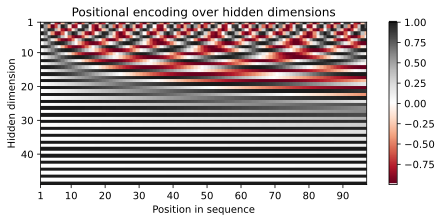

In [ ]:
encod_block = PositionalEncoding(d_model=48, max_len=96)
pe = encod_block.pe.squeeze().T.cpu().numpy()

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,3))
pos = ax.imshow(pe, cmap="RdGy", extent=(1,pe.shape[1]+1,pe.shape[0]+1,1))
fig.colorbar(pos, ax=ax)
ax.set_xlabel("Position in sequence")
ax.set_ylabel("Hidden dimension")
ax.set_title("Positional encoding over hidden dimensions")
ax.set_xticks([1]+[i*10 for i in range(1,1+pe.shape[1]//10)])
ax.set_yticks([1]+[i*10 for i in range(1,1+pe.shape[0]//10)])
plt.show()

隠れた次元の位置をエンコードする異なる波長の正弦波と余弦波がはっきりと見えます。具体的には、各隠れ次元の正弦/余弦波を個別に見て、パターンのより良い直感を得ることができます。以下に、非表示次元 1、2、3、および 4 の位置エンコーディングを視覚化します。

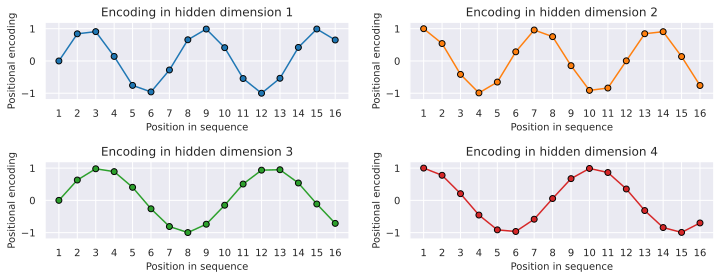

In [ ]:
sns.set_theme()
fig, ax = plt.subplots(2, 2, figsize=(12,4))
ax = [a for a_list in ax for a in a_list]
for i in range(len(ax)):
    ax[i].plot(np.arange(1,17), pe[i,:16], color=f'C{i}', marker="o", markersize=6, markeredgecolor="black")
    ax[i].set_title(f"Encoding in hidden dimension {i+1}")
    ax[i].set_xlabel("Position in sequence", fontsize=10)
    ax[i].set_ylabel("Positional encoding", fontsize=10)
    ax[i].set_xticks(np.arange(1,17))
    ax[i].tick_params(axis='both', which='major', labelsize=10)
    ax[i].tick_params(axis='both', which='minor', labelsize=8)
    ax[i].set_ylim(-1.2, 1.2)
fig.subplots_adjust(hspace=0.8)
sns.reset_orig()
plt.show()

隠しディメンション 1 と 2 の間のパターンは、開始角度のみが異なります。波長は
2π、したがって位置 6 の後繰り返しになります。隠れた次元
2 と 3 は約 2 倍の波長を持っています。

### Section2-6. 学習率　ウォームアップ
Transformer のトレーニングに一般的に使用される手法の 1 つは、[学習率のウォームアップ](https://qiita.com/koshian2/items/c3e37f026e8db0c5a398)です。これは、最初の数回の反復で、学習率を 0 から最初に指定した学習率まで徐々に増加させることを意味します。したがって、最初から非常に大きなステップを踏むのではなく、ゆっくりと学習を開始します。実際、学習率のウォームアップを行わずに深い Transformer をトレーニングすると、モデルが発散し、トレーニングとテストでパフォーマンスが大幅に低下する可能性があります。たとえば、Liu らによる次のプロットを見てみましょう。 (2019) Adam-vanilla (つまり、ウォームアップなしの Adam) とウォームアップありの Adam の比較:

![WarmUp](https://drive.google.com/uc?id=1KO86db569BivbEDRy_Ik3IphBzPwQWCR)

ウォームアップが Transformer アーキテクチャの重要なハイパーパラメータであることは明らかです。なぜそんなに重要なのかについては、現在、2 つの一般的な説明があります。まず、Adam はバイアス補正係数を使用しますが、最初の反復中に適応学習率の分散が大きくなる可能性があります。 RAdam などの改善されたオプティマイザは、この問題を克服することが示されています。トレーニング Transformer のウォームアップは必要ありません。第二に、レイヤー全体に繰り返し適用されるレイヤー正規化は、最初の反復中に非常に高い勾配につながる可能性があります。これは、Pre-Layer正規化 (Pre-Activation ResNet と同様) を使用するか、レイヤー正規化を他の手法 (適応正規化、適応正規化、パワーノーマライゼーション）に置き換えることも考えられます。

それにもかかわらず、多くのアプリケーションや論文ではまだ元の Transformer アーキテクチャを Adam で使用しています。これは、ウォームアップが最初の反復で勾配問題を解決するためのシンプルでありながら効果的な方法であるためです。使用できるさまざまなスケジューラーが多数あります。たとえば、元の Transformer の論文では、ウォームアップを伴う指数関数的減衰スケジューラが使用されていました。ただし、現在最も人気のあるスケジューラは、ウォームアップとコサイン形状の学習率の減衰を組み合わせたコサイン ウォームアップ スケジューラです。以下でそれを実装し、エポックにわたる学習率係数を視覚化できます。



In [ ]:
class CosineWarmupScheduler(optim.lr_scheduler._LRScheduler):
    
    def __init__(self, optimizer, warmup, max_iters):
        self.warmup = warmup
        self.max_num_iters = max_iters
        super().__init__(optimizer)
        
    def get_lr(self):
        lr_factor = self.get_lr_factor(epoch=self.last_epoch)
        return [base_lr * lr_factor for base_lr in self.base_lrs]
    
    def get_lr_factor(self, epoch):
        lr_factor = 0.5 * (1 + np.cos(np.pi * epoch / self.max_num_iters))
        if epoch <= self.warmup:
            lr_factor *= epoch * 1.0 / self.warmup
        return lr_factor

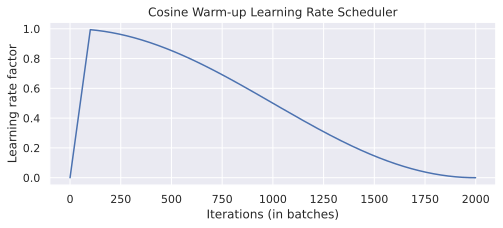

In [ ]:
# Needed for initializing the lr scheduler
p = nn.Parameter(torch.empty(4,4))
optimizer = optim.Adam([p], lr=1e-3)
lr_scheduler = CosineWarmupScheduler(optimizer=optimizer, warmup=100, max_iters=2000)

# Plotting
epochs = list(range(2000))
sns.set()
plt.figure(figsize=(8,3))
plt.plot(epochs, [lr_scheduler.get_lr_factor(e) for e in epochs])
plt.ylabel("Learning rate factor")
plt.xlabel("Iterations (in batches)")
plt.title("Cosine Warm-up Learning Rate Scheduler")
plt.show()
sns.reset_orig()

最初の 100 回の反復では、学習率係数を 0 から 1 に増やしますが、それ以降のすべての反復では、余弦波を使用して減衰させます。このスケジューラの事前実装は、人気のある NLP Transformer ライブラリの [huggingface](https://huggingface.co/transformers/main_classes/optimizer_schedules.html?highlight=cosine#transformers.get_cosine_schedule_with_warmup) にあります。

### Section2-7. PyTorch Lightning モジュール


In [ ]:
class TransformerPredictor(pl.LightningModule):

    def __init__(self, input_dim, model_dim, num_classes, num_heads, num_layers, lr, warmup, max_iters, dropout=0.0, input_dropout=0.0):
        """
        Inputs:
            input_dim - Hidden dimensionality of the input
            model_dim - Hidden dimensionality to use inside the Transformer
            num_classes - Number of classes to predict per sequence element
            num_heads - Number of heads to use in the Multi-Head Attention blocks
            num_layers - Number of encoder blocks to use.
            lr - Learning rate in the optimizer
            warmup - Number of warmup steps. Usually between 50 and 500
            max_iters - Number of maximum iterations the model is trained for. This is needed for the CosineWarmup scheduler
            dropout - Dropout to apply inside the model
            input_dropout - Dropout to apply on the input features
        """
        super().__init__()
        self.save_hyperparameters()
        self._create_model()

    def _create_model(self):
        # Input dim -> Model dim
        self.input_net = nn.Sequential(
            nn.Dropout(self.hparams.input_dropout),
            nn.Linear(self.hparams.input_dim, self.hparams.model_dim)
        )
        # Positional encoding for sequences
        self.positional_encoding = PositionalEncoding(d_model=self.hparams.model_dim)
        # Transformer
        self.transformer = TransformerEncoder(num_layers=self.hparams.num_layers,
                                              input_dim=self.hparams.model_dim,
                                              dim_feedforward=2*self.hparams.model_dim,
                                              num_heads=self.hparams.num_heads,
                                              dropout=self.hparams.dropout)
        # Output classifier per sequence lement
        self.output_net = nn.Sequential(
            nn.Linear(self.hparams.model_dim, self.hparams.model_dim),
            nn.LayerNorm(self.hparams.model_dim),
            nn.ReLU(inplace=True),
            nn.Dropout(self.hparams.dropout),
            nn.Linear(self.hparams.model_dim, self.hparams.num_classes)
        ) 

    def forward(self, x, mask=None, add_positional_encoding=True):
        """
        Inputs:
            x - Input features of shape [Batch, SeqLen, input_dim]
            mask - Mask to apply on the attention outputs (optional)
            add_positional_encoding - If True, we add the positional encoding to the input.
                                      Might not be desired for some tasks.
        """
        x = self.input_net(x)
        if add_positional_encoding:
            x = self.positional_encoding(x)
        x = self.transformer(x, mask=mask)
        x = self.output_net(x)
        return x

    @torch.no_grad()
    def get_attention_maps(self, x, mask=None, add_positional_encoding=True):
        """
        Function for extracting the attention matrices of the whole Transformer for a single batch.
        Input arguments same as the forward pass.
        """
        x = self.input_net(x)
        if add_positional_encoding:
            x = self.positional_encoding(x)
        attention_maps = self.transformer.get_attention_maps(x, mask=mask)
        return attention_maps

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.lr)
        
        # Apply lr scheduler per step
        lr_scheduler = CosineWarmupScheduler(optimizer, 
                                             warmup=self.hparams.warmup, 
                                             max_iters=self.hparams.max_iters)
        return [optimizer], [{'scheduler': lr_scheduler, 'interval': 'step'}]

    def training_step(self, batch, batch_idx):
        raise NotImplementedError

    def validation_step(self, batch, batch_idx):
        raise NotImplementedError    

    def test_step(self, batch, batch_idx):
        raise NotImplementedError   

### Section2-8. 実験
Transformer アーキテクチャの実装が完了したら、実験を開始してさまざまなタスクに適用できます。このノートブックでは、2 つのタスクに焦点を当てます: 並列 Sequence-to-Sequence とセット異常検出です。 2 つのタスクは、Transformer アーキテクチャのさまざまなプロパティに焦点を当てています。以下で説明します。

#### Section2-8-1. Sequence to Sequence
Sequence-to-Sequence タスクは、入力と出力がシーケンスであり、必ずしも同じ長さではないタスクを表します。この分野で人気のあるタスクには、機械翻訳と要約が含まれます。このために、通常、入力シーケンスを解釈するための Transformer エンコーダーと、自己回帰方式で出力を生成するためのデコーダーがあります。ただし、ここでは、はるかに単純なサンプル タスクに戻り、エンコーダのみを使用します。

まず、以下のデータセット クラスを作成しましょう。

In [ ]:
class ReverseDataset(data.Dataset):

    def __init__(self, num_categories, seq_len, size):
        super().__init__()
        self.num_categories = num_categories
        self.seq_len = seq_len
        self.size = size
        
        self.data = torch.randint(self.num_categories, size=(self.size, self.seq_len))
  
    def __len__(self):
        return self.size

    def __getitem__(self, idx):
        inp_data = self.data[idx]
        labels = torch.flip(inp_data, dims=(0,))
        return inp_data, labels

0 から `num_categories-1` までの任意の数のランダムな数列を作成します。ラベルは、単にシーケンス次元を反転したテンソルです。以下の対応するデータローダーを作成できます。

In [ ]:
dataset = partial(ReverseDataset, 10, 16)
train_loader = data.DataLoader(dataset(50000), batch_size=128, shuffle=True, drop_last=True, pin_memory=True)
val_loader   = data.DataLoader(dataset(1000), batch_size=128)
test_loader  = data.DataLoader(dataset(10000), batch_size=128)

データセットの任意のサンプルを見てみましょう。

In [ ]:
inp_data, labels = train_loader.dataset[0]
print("Input data:", inp_data)
print("Labels:    ", labels)

Input data: tensor([9, 6, 2, 0, 6, 2, 7, 9, 7, 3, 3, 4, 3, 7, 0, 9])
Labels:     tensor([9, 0, 7, 3, 4, 3, 3, 7, 9, 7, 2, 6, 0, 2, 6, 9])


トレーニング中、入力シーケンスを Transformer エンコーダーに渡し、各入力トークンの出力を予測します。これを実行するために、標準のクロスエントロピー損失を使用します。すべての数値は、ワンホット ベクトルとして表されます。
カテゴリを単一のスカラーとして表すと、次のようにモデルの表現力が極端に低下することに注意してください。
この例では、0 と 1 は 0 と 9 よりも密接に関連していません。

ワンホット ベクトルに代わるものは、PyTorch モジュール `nn.Embedding` によって提供される学習済み埋め込みベクトルを使用することです。ただし、この場合のように、追加の線形レイヤーでワンホット ベクトルを使用すると、埋め込みレイヤーと同じ効果があります (`self.input_net` は、ワンホット ベクトルを密なベクトルにマップします。ここで、重み行列の各行は、埋め込みを表します)。

In [ ]:
class ReversePredictor(TransformerPredictor):
    
    def _calculate_loss(self, batch, mode="train"):
        # Fetch data and transform categories to one-hot vectors
        inp_data, labels = batch
        inp_data = F.one_hot(inp_data, num_classes=self.hparams.num_classes).float()
        
        # Perform prediction and calculate loss and accuracy
        preds = self.forward(inp_data, add_positional_encoding=True)
        loss = F.cross_entropy(preds.view(-1,preds.size(-1)), labels.view(-1))
        acc = (preds.argmax(dim=-1) == labels).float().mean()
        
        # Logging
        self.log(f"{mode}_loss", loss)
        self.log(f"{mode}_acc", acc)
        return loss, acc
        
    def training_step(self, batch, batch_idx):
        loss, _ = self._calculate_loss(batch, mode="train")
        return loss
    
    def validation_step(self, batch, batch_idx):
        _ = self._calculate_loss(batch, mode="val")
    
    def test_step(self, batch, batch_idx):
        _ = self._calculate_loss(batch, mode="test")

最後に、PyTorch Lightning  で見たものと同様のトレーニング関数を作成できます。実行する `pl.Trainer` オブジェクトを作成します
 エポック、`TensorBoard` へのログイン、および検証に基づく最適なモデルの保存。その後、テスト セットでモデルをテストします。ここでトレーナーに渡す追加のパラメーターは、`gradient_clip_val` です。これにより、オプティマイザーのステップを実行する前にすべてのパラメーターの勾配のノルムがクリップされ、たとえば、急激な損失面で非常に高い勾配が得られた場合にモデルが発散するのを防ぎます (DeepAI 用語集などの勾配クリッピングに関する多くの優れたブログ記事を参照してください)。トランスフォーマーの場合、勾配クリッピングは、最初の数回の反復中とその後のトレーニングをさらに安定させるのに役立ちます。プレーンな PyTorch では、 `torch.nn.utils.clip_grad_norm_(...)` を介して勾配クリッピングを適用できます (ドキュメントを参照)。クリップ値は通常、大きなグラデーションをどの程度クリップするかによって異なりますが、0.5 から 10 の間です。これを説明した後、トレーニング関数を実装しましょう。

In [ ]:
def train_reverse(**kwargs):
    # Create a PyTorch Lightning trainer with the generation callback
    root_dir = os.path.join(CHECKPOINT_PATH, "ReverseTask")
    os.makedirs(root_dir, exist_ok=True)
    trainer = pl.Trainer(default_root_dir=root_dir, 
                         callbacks=[ModelCheckpoint(save_weights_only=True, mode="max", monitor="val_acc")],
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=10,
                         gradient_clip_val=5)
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need
    
    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, "ReverseTask.ckpt")
    if os.path.isfile(pretrained_filename):
        print("Found pretrained model, loading...")
        model = ReversePredictor.load_from_checkpoint(pretrained_filename)
    else:
        model = ReversePredictor(max_iters=trainer.max_epochs*len(train_loader), **kwargs)
        trainer.fit(model, train_loader, val_loader)
        
    # Test best model on validation and test set
    val_result = trainer.test(model, val_loader, verbose=False)
    test_result = trainer.test(model, test_loader, verbose=False)
    result = {"test_acc": test_result[0]["test_acc"], "val_acc": val_result[0]["test_acc"]}
    
    model = model.to(device)
    return model, result

最後に、モデルをトレーニングできます。この設定では、Multi-Head Attention で 1 つのエンコーダ ブロックと 1 つのヘッドを使用します。これは、タスクの単純さのためこのような設定をしています。この場合、アテンションは実際には予測の「説明」として解釈できます。

In [ ]:
reverse_model, reverse_result = train_reverse(input_dim=train_loader.dataset.num_categories,
                                              model_dim=32,
                                              num_heads=1,
                                              num_classes=train_loader.dataset.num_categories,
                                              num_layers=1,
                                              dropout=0.0,
                                              lr=5e-4,
                                              warmup=50)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.0.2 to v2.0.0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/vol5/ReverseTask.ckpt`


Found pretrained model, loading...


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

ワーカー数に関する PyTorch Lightning の警告は、今のところ無視できます。データセットは非常に単純で、`__getitem__ `は無視できる時間で終了するため、データを提供するサブプロセスは必要ありません (実際、プロセス/スレッド間の通信オーバーヘッドがあるため、より多くのワーカーがトレーニングを遅くする可能性があります)。まず、結果を見てみましょう。

In [ ]:
print(f"Val accuracy:  {(100.0 * reverse_result['val_acc']):4.2f}%")
print(f"Test accuracy: {(100.0 * reverse_result['test_acc']):4.2f}%")

Val accuracy:  100.00%
Test accuracy: 100.00%


予想どおり、Transformer はタスクを正しく解決できます。しかし、Multi-Head Attention ブロックのアテンションは、任意の入力に対してどのように見えるでしょうか?以下でそれを視覚化してみましょう。

In [ ]:
data_input, labels = next(iter(val_loader))
inp_data = F.one_hot(data_input, num_classes=reverse_model.hparams.num_classes).float()
inp_data = inp_data.to(device)
attention_maps = reverse_model.get_attention_maps(inp_data)

In [ ]:
attention_maps[0].shape

torch.Size([128, 1, 16, 16])

次に、シーケンス、アテンション マップ、およびアテンション マップを視覚化するバッチ要素を示すインデックスを入力として受け取るプロット関数を作成します。行の上に異なるレイヤーがあり、列の上に異なる頭を示すプロットを作成します。ソフトマックスは行ごとに個別に適用されていることに注意してください。

In [ ]:
def plot_attention_maps(input_data, attn_maps, idx=0):
    if input_data is not None:
        input_data = input_data[idx].detach().cpu().numpy()
    else:
        input_data = np.arange(attn_maps[0][idx].shape[-1])
    attn_maps = [m[idx].detach().cpu().numpy() for m in attn_maps]
    
    num_heads = attn_maps[0].shape[0]
    num_layers = len(attn_maps)
    seq_len = input_data.shape[0]
    fig_size = 4 if num_heads == 1 else 3
    fig, ax = plt.subplots(num_layers, num_heads, figsize=(num_heads*fig_size, num_layers*fig_size))
    if num_layers == 1:
        ax = [ax]
    if num_heads == 1:
        ax = [[a] for a in ax]
    for row in range(num_layers):
        for column in range(num_heads):
            ax[row][column].imshow(attn_maps[row][column], origin='lower', vmin=0)
            ax[row][column].set_xticks(list(range(seq_len)))
            ax[row][column].set_xticklabels(input_data.tolist())
            ax[row][column].set_yticks(list(range(seq_len)))
            ax[row][column].set_yticklabels(input_data.tolist())
            ax[row][column].set_title(f"Layer {row+1}, Head {column+1}")
    fig.subplots_adjust(hspace=0.5)
    plt.show()

最後に、タスクトレーニング済みの Transformer のアテンション マップをプロットできます

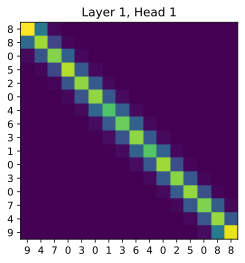

In [ ]:
plot_attention_maps(data_input, attention_maps, idx=0)

モデルは、それ自体の反転インデックスにあるトークンに注意を向けることを学習しました。したがって、それは実際に私たちが意図したことを実行できます。ただし、反転インデックスに近い値にもアテンションしていることがわかります。これは、モデルがこの問題を解決するために完璧でハードなアテンションを必要としないためですが、このおおよそのノイズの多いアテンション マップでは問題ありません。近くのインデックスは、位置エンコーディングの類似性によって引き起こされます。

### Section2-9. Set Anomaly Detection (セット異常検知)
シーケンスに加えて、セットは多くのアプリケーションに関連する別のデータ構造です。シーケンスとは対照的に、要素はセット内で順不同です。 RNN は、データ内の順序を仮定することによってのみセットに適用できますが、データ内に存在しない順序・パターンに向けてモデルを偏向（バイアス）します。 Vinyalsら (2015) および他の論文は、仮定された順序がモデルのパフォーマンスに重大な影響を与える可能性があることを示しているため、セットで RNN を使用しないようにする必要があります。理想的には、セット内の要素をどのように並べ替えても出力が同じになるように、モデルは順列同変/不変でなければなりません。

Multi-Head Attention は順列等価であるため、トランスフォーマーはこれに最適なアーキテクチャを提供します。したがって、入力を入力する順序に関係なく同じ値を出力します (入力と出力は均等に並べ替えられます)。セットについて検討しているタスクは、セットの異常検出です。これは、他のセットに適合しないセット内の要素を見つけようとすることを意味します。研究コミュニティでは、異常検出の一般的なアプリケーションが一連の画像に対して実行されます。ここで、(N-1) 個の画像は同じカテゴリに属している/同じ高レベルの特徴を持ち、一方の画像は別のカテゴリに属しています。

カテゴリは、必ずしも標準的な分類問題のクラスに関連付ける必要はありませんが、複数の機能の組み合わせである可能性があることに注意してください。たとえば、顔のデータセットでは、これは眼鏡をかけた人、男性、あごひげなどである可能性があります。さまざまな動物を区別する例を以下に示します。最初の 4 つの画像はキツネを示していますが、最後の画像は別の動物を表しています。最後の画像が別の動物を示していることを認識したいのですが、それがどのクラスの動物であるかは関係ありません。

![動物の識別](https://drive.google.com/uc?id=1o2-BgaAS6vFQvniXUXjz1wTYMvHoo2Nj)

CIFAR100 データセットを使用します。 CIFAR100 には、CIFAR10 と同様に、それぞれ 32x32 の解像度を持つ 100 クラスの 600 枚の画像があります。クラスの数が増えると、モデルは CIFAR10 のような大まかな特徴ではなく、画像内の特定の特徴に注意を払う必要があるため、タスクが難しくなります。あるクラスの 9 枚の画像と別のクラスの 1 枚の画像のセットをモデルに表示します。タスクは、他の画像とは異なるクラスの画像を見つけることです。生の画像を Transformer への入力として直接使用することはお勧めできません。これは、CNN のように変換不変ではなく、まず高次元の入力から画像の特徴を検出する方法を学習する必要があるためです。代わりに、torchvision パッケージの事前トレーニング済み ResNet34 モデルを使用して、画像の高レベルで低次元の特徴を取得します。 ResNet モデルは、1k クラスのさまざまな解像度の 100 万枚の画像を含む ImageNet データセットで事前トレーニングされています。ただし、トレーニングとテストの間、画像は通常 224x224 の解像度にスケーリングされるため、CIFAR 画像もこの解像度に再スケーリングします。以下では、データセットをロードし、ResNet モデルによって処理されるデータを準備します。

In [ ]:
# ImageNet statistics
DATA_MEANS = np.array([0.485, 0.456, 0.406])
DATA_STD = np.array([0.229, 0.224, 0.225])
# As torch tensors for later preprocessing
TORCH_DATA_MEANS = torch.from_numpy(DATA_MEANS).view(1,3,1,1)
TORCH_DATA_STD = torch.from_numpy(DATA_STD).view(1,3,1,1)

# Resize to 224x224, and normalize to ImageNet statistic
transform = transforms.Compose([transforms.Resize((224,224)),
                                transforms.ToTensor(),
                                transforms.Normalize(DATA_MEANS, DATA_STD)
                                ])
# Loading the training dataset. 
train_set = CIFAR100(root=DATASET_PATH, train=True, transform=transform, download=True)

# Loading the test set
test_set = CIFAR100(root=DATASET_PATH, train=False, transform=transform, download=True)

  0%|          | 0/169001437 [00:00<?, ?it/s]

Extracting ../data/cifar-100-python.tar.gz to ../data
Files already downloaded and verified


次に、画像に対して事前トレーニング済みの ResNet モデルを実行し、分類レイヤーの前に特徴を抽出します。これらは最も高度な機能であり、画像を十分に説明する必要があります。 CIFAR100 は ImageNet といくらか類似しているため、ResNet モデルをいかなる形式でも再トレーニングしていません。ただし、最高のパフォーマンスを得て、非常に大きなデータセットが必要な場合は、トレーニング中に ResNet を計算グラフに追加し、そのパラメーターも微調整することをお勧めします。十分な大きさのデータセットがなく、モデルを効率的にトレーニングしたいので、事前に特徴を抽出します。以下のモデルを読み込んで準備しましょう。

In [ ]:
import os
os.environ["TORCH_HOME"] = CHECKPOINT_PATH
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
# Remove classification layer
# In some models, it is called "fc", others have "classifier"
# Setting both to an empty sequential represents an identity map of the final features.
pretrained_model.fc = nn.Sequential()
pretrained_model.classifier = nn.Sequential()
# To GPU
pretrained_model = pretrained_model.to(device)

# Only eval, no gradient required
pretrained_model.eval()
for p in pretrained_model.parameters():
    p.requires_grad = False

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to ../saved_models/vol5/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

以下の機能の抽出関数を記述します。モデルがかなり深く、画像が比較的大きいため、このセルには GPU へのアクセスが必要です。 GoogleColab の GPU で十分ですが、このセルの実行には 2 ～ 3 分かかる場合があります。実行すると、機能はディスクにエクスポートされるため、ノートブックを実行するたびに再計算する必要はありません。ただし、これには 150MB を超える空きディスク容量が必要です。そのため、十分な空きディスクと GPU がある場合は、これをローカル コンピューターでのみ実行することをお勧めします (GoogleColab はこれに適しています)。 

In [ ]:
@torch.no_grad()
def extract_features(dataset, save_file):
    if not os.path.isfile(save_file):
        data_loader = data.DataLoader(dataset, batch_size=128, shuffle=False, drop_last=False, num_workers=4)
        extracted_features = []
        for imgs, _ in tqdm(data_loader):
            imgs = imgs.to(device)
            feats = pretrained_model(imgs)
            extracted_features.append(feats)
        extracted_features = torch.cat(extracted_features, dim=0)
        extracted_features = extracted_features.detach().cpu()
        torch.save(extracted_features, save_file)
    else:
        extracted_features = torch.load(save_file)
    return extracted_features

train_feat_file = os.path.join(CHECKPOINT_PATH, "train_set_features.tar")
train_set_feats = extract_features(train_set, train_feat_file)

test_feat_file = os.path.join(CHECKPOINT_PATH, "test_set_features.tar")
test_feats = extract_features(test_set, test_feat_file)

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

以下の特徴形状を確認してみましょう。トレーニングには 50,000 個の要素が必要で、テストには 10,000 個の画像が必要です。 ResNet34 の特徴次元は 512 です。他のモデルを試してみると、異なる特徴次元が表示される可能性があります。

In [ ]:
print("Train:", train_set_feats.shape)
print("Test: ", test_feats.shape)

Train: torch.Size([50000, 512])
Test:  torch.Size([10000, 512])


いつものように、いつトレーニングを停止する必要があるかを検出するための検証セットを作成します。この場合、トレーニング セットを 90% トレーニング、10% 検証に分割します。ただし、ここで問題となるのは、検証セットに 100 個のラベルすべてに対して同じ数の画像があることを確認する必要があることです。そうしないと、クラスの不均衡が発生し、画像セットの作成に適していません。したがって、各クラスの画像の 10% を取得し、それらを検証セットに移動します。以下のコードはまさにこれを行います。

これで、set anomaly タスク用のデータセット クラスを準備できます。エポックを、各画像が「異常」として 1 回だけ発生したシーケンスと定義します。したがって、データセットの長さはその中の画像の数です。
トレーニング セットでは、`__getitem__` を使用してアイテムにアクセスするたびに、対応するインデックス `idx` の画像とは異なるクラスをランダムにサンプリングします。

2 番目のステップでは、このサンプリングされたクラスの (N-1) 枚の画像をサンプリングします。 10 枚の画像のセットが最終的に返されます。 `__getitem__` のランダム性により、反復ごとにわずかに異なるセットを確認できます。

ただし、反復するたびにテスト データセットを同じにする必要があるため、テスト セットに同じ戦略を使用することはできません。したがって、`__init__` メソッドでセットをサンプリングし、それらを `__getitem__` で返します。以下のコードは、まさにこのダイナミクスを実装しています。

In [ ]:
## Split train into train+val
# Get labels from train set
labels = train_set.targets

# Get indices of images per class
labels = torch.LongTensor(labels)
num_labels = labels.max()+1
sorted_indices = torch.argsort(labels).reshape(num_labels, -1) # [classes, num_imgs per class]

# Determine number of validation images per class
num_val_exmps = sorted_indices.shape[1] // 10

# Get image indices for validation and training
val_indices   = sorted_indices[:,:num_val_exmps].reshape(-1)
train_indices = sorted_indices[:,num_val_exmps:].reshape(-1)

# Group corresponding image features and labels
train_feats, train_labels = train_set_feats[train_indices], labels[train_indices]
val_feats,   val_labels   = train_set_feats[val_indices],   labels[val_indices]

次に、以下のデータセットとデータローダーをセットアップできます。ここでは、10 のセット サイズを使用します。つまり、1 つのカテゴリからの 9 つの画像 + 1 つの異常です。サイズを試してみたい場合は、自由に変更してください。

In [ ]:
class SetAnomalyDataset(data.Dataset):
    
    def __init__(self, img_feats, labels, set_size=10, train=True):
        """
        Inputs:
            img_feats - Tensor of shape [num_imgs, img_dim]. Represents the high-level features.
            labels - Tensor of shape [num_imgs], containing the class labels for the images
            set_size - Number of elements in a set. N-1 are sampled from one class, and one from another one.
            train - If True, a new set will be sampled every time __getitem__ is called.
        """
        super().__init__()
        self.img_feats = img_feats
        self.labels = labels
        self.set_size = set_size-1 # The set size is here the size of correct images
        self.train = train
        
        # Tensors with indices of the images per class
        self.num_labels = labels.max()+1
        self.img_idx_by_label = torch.argsort(self.labels).reshape(self.num_labels, -1)
        
        if not train:
            self.test_sets = self._create_test_sets()
            
            
    def _create_test_sets(self):
        # Pre-generates the sets for each image for the test set
        test_sets = []
        num_imgs = self.img_feats.shape[0]
        np.random.seed(42)
        test_sets = [self.sample_img_set(self.labels[idx]) for idx in range(num_imgs)]
        test_sets = torch.stack(test_sets, dim=0)
        return test_sets
            
        
    def sample_img_set(self, anomaly_label):
        """
        Samples a new set of images, given the label of the anomaly. 
        The sampled images come from a different class than anomaly_label
        """
        # Sample class from 0,...,num_classes-1 while skipping anomaly_label as class
        set_label = np.random.randint(self.num_labels-1)
        if set_label >= anomaly_label:
            set_label += 1
            
        # Sample images from the class determined above
        img_indices = np.random.choice(self.img_idx_by_label.shape[1], size=self.set_size, replace=False)
        img_indices = self.img_idx_by_label[set_label, img_indices]
        return img_indices
        
        
    def __len__(self):
        return self.img_feats.shape[0]
    
    
    def __getitem__(self, idx):
        anomaly = self.img_feats[idx]
        if self.train: # If train => sample
            img_indices = self.sample_img_set(self.labels[idx])
        else: # If test => use pre-generated ones
            img_indices = self.test_sets[idx]
            
        # Concatenate images. The anomaly is always the last image for simplicity
        img_set = torch.cat([self.img_feats[img_indices], anomaly[None]], dim=0)
        indices = torch.cat([img_indices, torch.LongTensor([idx])], dim=0)
        label = img_set.shape[0]-1
        
        # We return the indices of the images for visualization purpose. "Label" is the index of the anomaly
        return img_set, indices, label

データセットをもう少しよく理解するために、テスト データセットからいくつかのセットを下にプロットできます。各行は異なる入力セットを示しており、最初の 9 つは同じクラスからのものです。

In [ ]:
SET_SIZE = 10
test_labels = torch.LongTensor(test_set.targets)

train_anom_dataset = SetAnomalyDataset(train_feats, train_labels, set_size=SET_SIZE, train=True)
val_anom_dataset   = SetAnomalyDataset(val_feats,   val_labels,   set_size=SET_SIZE, train=False)
test_anom_dataset  = SetAnomalyDataset(test_feats,  test_labels,  set_size=SET_SIZE, train=False)

train_anom_loader = data.DataLoader(train_anom_dataset, batch_size=64, shuffle=True,  drop_last=True,  num_workers=4, pin_memory=True)
val_anom_loader   = data.DataLoader(val_anom_dataset,   batch_size=64, shuffle=False, drop_last=False, num_workers=4)
test_anom_loader  = data.DataLoader(test_anom_dataset,  batch_size=64, shuffle=False, drop_last=False, num_workers=4)

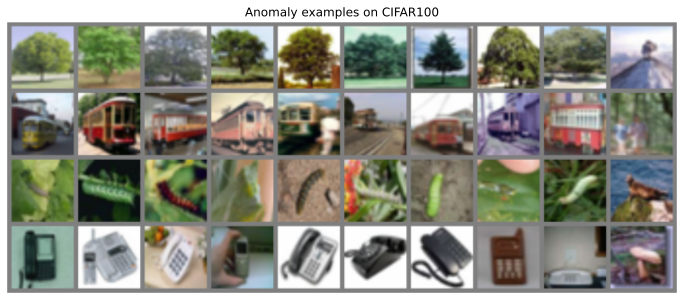

In [ ]:
def visualize_exmp(indices, orig_dataset):
    images = [orig_dataset[idx][0] for idx in indices.reshape(-1)]
    images = torch.stack(images, dim=0)
    images = images * TORCH_DATA_STD + TORCH_DATA_MEANS
    
    img_grid = torchvision.utils.make_grid(images, nrow=SET_SIZE, normalize=True, pad_value=0.5, padding=16)
    img_grid = img_grid.permute(1, 2, 0)

    plt.figure(figsize=(12,8))
    plt.title("Anomaly examples on CIFAR100")
    plt.imshow(img_grid)
    plt.axis('off')
    plt.show()
    plt.close()

_, indices, _ = next(iter(test_anom_loader))
visualize_exmp(indices[:4], test_set)

一部のセットでは、他のセットよりもタスクが簡単になる可能性があることが既にわかります。異常が異なるが視覚的に類似したクラスにある場合、特に問題が発生する可能性があります (例: 電車とバス、小麦粉とワームなど)。

データを準備したら、モデルを詳しく見てみましょう。ここでは、セット全体の分類を行います。予測が順列同変であるためには、画像ごとに 1 つのロジットを出力します。これらのロジットに対して、ソフトマックスを適用し、異常画像をトレーニングして、最高のスコア/確率を取得します。ソフトマックスは従来の意味での出力クラスではなく、画像に適用されるため、これは標準の分類レイヤーとは少し異なります。ただし、2 つの画像の位置を入れ替えると、出力ソフトマックスでの位置が効果的に入れ替えられます。したがって、予測は入力に対して同変です。このアイデアは、以下の Transformer Lightning モジュールのサブクラスに実装されています。

In [ ]:
class AnomalyPredictor(TransformerPredictor):
    
    def _calculate_loss(self, batch, mode="train"):
        img_sets, _, labels = batch
        preds = self.forward(img_sets, add_positional_encoding=False) # No positional encodings as it is a set, not a sequence!
        preds = preds.squeeze(dim=-1) # Shape: [Batch_size, set_size]
        loss = F.cross_entropy(preds, labels) # Softmax/CE over set dimension
        acc = (preds.argmax(dim=-1) == labels).float().mean()
        self.log(f"{mode}_loss", loss)
        self.log(f"{mode}_acc", acc, on_step=False, on_epoch=True)
        return loss, acc
        
    def training_step(self, batch, batch_idx):
        loss, _ = self._calculate_loss(batch, mode="train")
        return loss
    
    def validation_step(self, batch, batch_idx):
        _ = self._calculate_loss(batch, mode="val")
    
    def test_step(self, batch, batch_idx):
        _ = self._calculate_loss(batch, mode="test")

最後に、train 関数を以下に記述します。逆タスクとまったく同じ構造です。

In [ ]:
def train_anomaly(**kwargs):
    # Create a PyTorch Lightning trainer with the generation callback
    root_dir = os.path.join(CHECKPOINT_PATH, "SetAnomalyTask")
    os.makedirs(root_dir, exist_ok=True)
    trainer = pl.Trainer(default_root_dir=root_dir, 
                         callbacks=[ModelCheckpoint(save_weights_only=True, mode="max", monitor="val_acc")],
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=100,
                         gradient_clip_val=2)
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need
    
    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, "SetAnomalyTask.ckpt")
    if os.path.isfile(pretrained_filename):
        print("Found pretrained model, loading...")
        model = AnomalyPredictor.load_from_checkpoint(pretrained_filename)
    else:
        model = AnomalyPredictor(max_iters=trainer.max_epochs*len(train_anom_loader), **kwargs)
        trainer.fit(model, train_anom_loader, val_anom_loader)
        model = AnomalyPredictor.load_from_checkpoint(trainer.checkpoint_callback.best_model_path)
    
    # Test best model on validation and test set
    train_result = trainer.test(model, train_anom_loader, verbose=False)
    val_result = trainer.test(model, val_anom_loader, verbose=False)
    test_result = trainer.test(model, test_anom_loader, verbose=False)
    result = {"test_acc": test_result[0]["test_acc"], "val_acc": val_result[0]["test_acc"], "train_acc": train_result[0]["test_acc"]}
    
    model = model.to(device)
    return model, result

最後にモデルをトレーニングしましょう。それぞれ 4 つのアテンション ヘッドを持つ 4 つのレイヤーを使用します。モデルの隠れ次元は 256 であり、適切な正則化のためにモデル全体で 0.1 のドロップアウトを使用します。入力フィーチャにもドロップアウトを適用することに注意してください。これにより、モデルが画像ノイズに対してより堅牢になり、一般化が向上します。ここでも、ウォームアップを使用してモデルのトレーニングをゆっくりと開始します。

In [ ]:
anomaly_model, anomaly_result = train_anomaly(input_dim=train_anom_dataset.img_feats.shape[-1],
                                              model_dim=256,
                                              num_heads=4,
                                              num_classes=1,
                                              num_layers=4,
                                              dropout=0.1,
                                              input_dropout=0.1,
                                              lr=5e-4,
                                              warmup=100)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.0.2 to v2.0.0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/vol5/SetAnomalyTask.ckpt`
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:478: PossibleUserWarning: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
  rank_zero_warn(


Testing: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

In [ ]:
print(f"Train accuracy: {(100.0*anomaly_result['train_acc']):4.2f}%")
print(f"Val accuracy:   {(100.0*anomaly_result['val_acc']):4.2f}%")
print(f"Test accuracy:  {(100.0*anomaly_result['test_acc']):4.2f}%")

Train accuracy: 96.24%
Val accuracy:   95.92%
Test accuracy:  94.41%


予測はほぼ同じであり、異なるのはネットワーク操作内のわずかな数値の違いだけであることがわかります。

モデルをもう少し解釈するために、アテンション マップをモデル内にプロットできます。これにより、モデルが画像間で共有/通信している情報と、各頭が何を表しているかがわかります。まず、上記のテスト バッチのアテンション マップを抽出し、簡単にするために個別の予測を決定する必要があります。

In [ ]:
inp_data, indices, labels = next(iter(test_anom_loader))
inp_data = inp_data.to(device)

anomaly_model.eval()

with torch.no_grad():
    preds = anomaly_model.forward(inp_data, add_positional_encoding=False)
    preds = F.softmax(preds.squeeze(dim=-1), dim=-1)

    # Permut input data
    permut = np.random.permutation(inp_data.shape[1])
    perm_inp_data = inp_data[:,permut]
    perm_preds = anomaly_model.forward(perm_inp_data, add_positional_encoding=False)
    perm_preds = F.softmax(perm_preds.squeeze(dim=-1), dim=-1)

assert (preds[:,permut] - perm_preds).abs().max() < 1e-5, "Predictions are not permutation equivariant"

print("Preds\n", preds[0,permut].cpu().numpy())
print("Permuted preds\n", perm_preds[0].cpu().numpy())

Preds
 [2.7691316e-05 1.8979779e-05 1.7386321e-05 2.7842891e-05 1.6142869e-05
 1.7020795e-05 5.7294514e-05 9.9977750e-01 2.1365033e-05 1.8681747e-05]
Permuted preds
 [2.7691289e-05 1.8979779e-05 1.7386288e-05 2.7842863e-05 1.6142869e-05
 1.7020795e-05 5.7294455e-05 9.9977750e-01 2.1365013e-05 1.8681729e-05]


以下に、入力セットの画像、モデルの予測、およびトランスフォーマーのレイヤー上のさまざまな頭のアテンション マップをプロットするプロット関数を記述します。さまざまな入力例についても、アテンション マップを自由に調べてみてください。

In [ ]:
attention_maps = anomaly_model.get_attention_maps(inp_data, add_positional_encoding=False)
predictions = preds.argmax(dim=-1)

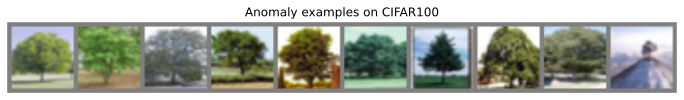

Prediction: 9


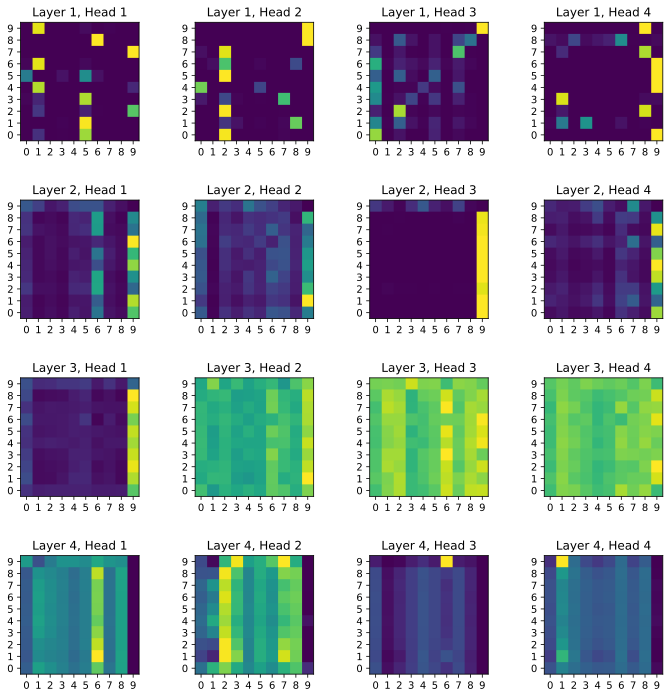

In [ ]:
def visualize_prediction(idx):
    visualize_exmp(indices[idx:idx+1], test_set)
    print("Prediction:", predictions[idx].item())
    plot_attention_maps(input_data=None, attn_maps=attention_maps, idx=idx)

visualize_prediction(0)

ランダム シードによっては、わずかに異なる入力セットが表示される場合があります。ウェブサイトのバージョンでは、9 種類の木の画像を火山と比較しています。レイヤー 2 ヘッド 1、レイヤー 2 ヘッド 3、レイヤー 3 ヘッド 1 など、複数のヘッドが最後の画像に焦点を合わせていることがわかります。さらに、レイヤー 4 のヘッドはすべて最後の画像を無視し、非常に低い注目確率を割り当てているようです。これは、モデルが実際に画像が設定に適合しないことを認識し、異常であると予測したことを示しています。レイヤ 3 ヘッド 2-4 は、すべての画像をわずかに加重平均するようです。これは、モデルがすべての画像の「平均」情報を抽出して、それを画像の特徴自体と比較していることを示している可能性があります。

モデルが実際に間違いを犯している場所を見つけてみましょう。これは、モデルが 9 以外を予測するセットを特定することで実現できます。データセットのように、異常が常にセットの最後の位置にあることを確認しました。

In [ ]:
mistakes = torch.where(predictions != 9)[0].cpu().numpy()
print("Indices with mistake:", mistakes)

Indices with mistake: [49]


モデルは最大 94% の精度を達成しているため、64 セットのバッチでのミスの数はごくわずかです。それでも、そのうちの 1 つ、たとえば最後のものを視覚化しましょう。

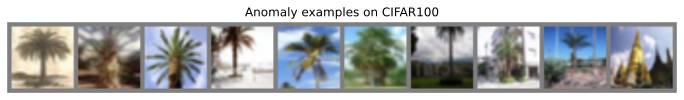

Prediction: 7


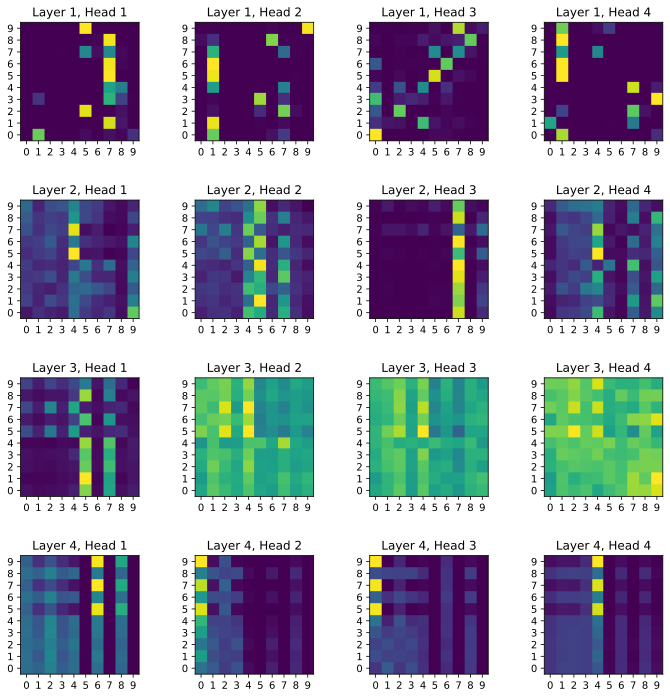

Probabilities:
Image 0: 0.07%
Image 1: 0.11%
Image 2: 0.07%
Image 3: 0.11%
Image 4: 0.17%
Image 5: 23.27%
Image 6: 0.16%
Image 7: 48.91%
Image 8: 0.10%
Image 9: 27.03%


In [ ]:
visualize_prediction(mistakes[-1])
print("Probabilities:")
for i, p in enumerate(preds[mistakes[-1]].cpu().numpy()):
    print(f"Image {i}: {100.0*p:4.2f}%")

この例では、モデルはヤシの木と建物を混同しており、画像 2 に約 90% の確率、実際の異常に 8% の確率を与えています。ただし、ここで難しいのは、建物の写真が手のひらと同じ角度で撮影されていることです。一方、画像 2 は、異なるカラー パレットを持つかなり変わった手のひらを示しています。これが、モデルがここで失敗する理由です。それにもかかわらず、一般的に、モデルは非常にうまく機能します。

## Section3. まとめ
入力要素間の相関関係と類似性を見つけるために、クエリとキーの間でスケーリングされた内積を使用する Multi-Head Attention レイヤーを詳しく調べました。 Transformer アーキテクチャは、Multi-Head Attention レイヤーに基づいており、それらの複数を ResNet のようなブロックに適用します。 Transformer は、多くのタスクやデータセットに適用できる非常に重要な最近のアーキテクチャです。 NLP での成功で最もよく知られていますが、それだけではありません。 sequence-to-sequence タスクへの適用と異常検出の設定を確認しました。位置エンコーディングを提供しない場合、順列同変であるというそのプロパティにより、多くの設定に一般化できます。したがって、アーキテクチャを理解することは重要ですが、学習率のウォームアップによって解決される最初の反復中の勾配問題など、考えられる問題も理解する必要があります。 Transformer アーキテクチャの研究を続けることに興味がある場合は、チュートリアル ノートブックの冒頭に記載されているブログ投稿を参照してください。